In [1]:
#hide
from IPython.display import Image, Video
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler as SS

from blog_utils import *

# When and How Dimensionality Reduction Fails

## Why dimensionality reduction?

As the years go by, the wealth of information available to us grows at an astonishing rate. But with great power comes great computational costs. The more data we have, the harder it is to sift through all of it to find the hidden patterns. This is especially true in the field of neuroscience, where the number of neurons being simultaneously recorded doubles every 7.4 years!<sup><a id="ref1" href="#references">[1]</a></sup>

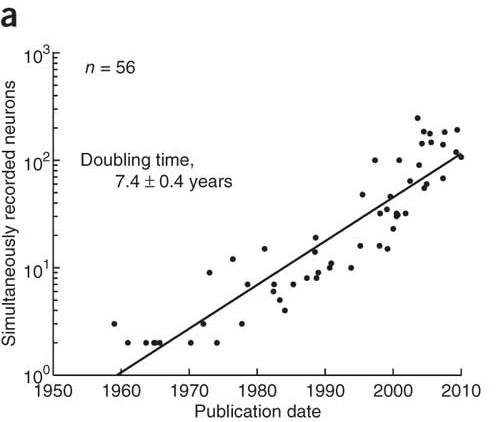

In [2]:
Image(filename="recorded_neurons.jpg")

This explosion of features in our datasets has made even exploratory analysis a daunting task. For this reason, most data processing workflows begin with a dimensionality reduction step. These are methods designed to create low dimensional datasets which preserve the important structure within the original dataset. However, no dimensionality reduction is perfect. Outside the special case where the manifold populated by the data is globally euclidean and of the same dimensionality as the low-dimensional embedding, all dimensionality reduction techniques will introduce some distortion. To visualize this, picture the many ways the globe (3-dimensional spherical surface) can be flattened to produce a map (a planar surface). All projections distort distances between points, areas of regions, or both! The goal of this blog post is to explore the ways in which this distortion occurs for datasets of known topology. Hopefully this provides some intuition for when these embeddings should be viewed with caution. Additionally, while there are as many methods of dimensionality reduction as there are stars in the sky, this blog will focus mainly on the non-parametric, non-linear methods t-SNE and UMAP, which enjoy considerable popularity in the field of neuroscience.

## What does it mean to preserve important structure from the original dataset?

This is the question that divides all dimensionality reduction techniques. The most straightforward, linear approach is to project the dataset onto a set of hyperplanes, creating a low-dimensional basis which maximizes the variance in the original dataset. This is PCA. This is a useful preprocessing step for many further analyses as it filters dimensions of low-variability, often noise, from the dataset. However, its linearity limits its usefulness as a tool for exploratory analysis, as it has difficulty distinguishing non-linear manifolds from linear manifolds. Consider two datasets: one containing points sampled from a 2-D disk and the other containing points sampled from the surface of a 3-D sphere. While both manifolds are two dimensional, the disk is linear while the sphere is not. Both datasets are linearly projected into a 10-D space and then combined with white noise at an SNR of 10dB. This is to simulate noisy observations of an ideal, noise-free manifold. Proir to computing the PCA decomposition, each feature in the high-dimensional dataset is independantly z-scored.

In [3]:
disk_dataset_lowd = sample_disk(2000, snr=None)
disk_dataset = embed_in_high_dim(disk_dataset_lowd, 10)

sphere_dataset_lowd = sample_sphere(3, 2000, snr=None)
sphere_dataset = embed_in_high_dim(sphere_dataset_lowd, 10)

# add high-dimensional noise at 10dB
disk_dataset = add_noise_like(disk_dataset, snr_db=10)
sphere_dataset = add_noise_like(sphere_dataset, snr_db=10)


sphere_PCA = PCA()
sphere_embed = sphere_PCA.fit_transform(SS().fit_transform(sphere_dataset))

disk_PCA = PCA()
disk_embed = disk_PCA.fit_transform(SS().fit_transform(disk_dataset))

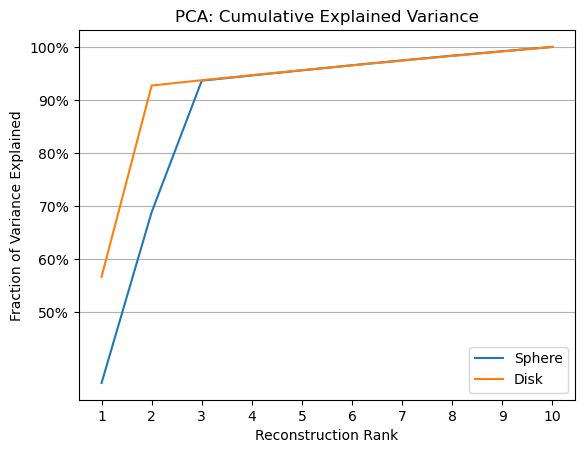

In [4]:
plt.figure()
plt.title("PCA: Cumulative Explained Variance")
plt.plot(np.cumsum(sphere_PCA.explained_variance_ratio_), label='Sphere')
plt.plot(np.cumsum(disk_PCA.explained_variance_ratio_), label='Disk')
plt.xticks(range(sphere_embed.shape[1]), np.arange(1, 1 + sphere_embed.shape[1]))
plt.yticks(np.arange(0.5, 1.01, 0.1), ['{:.0%}'.format(p) for p in np.arange(0.5, 1.01, 0.1)])
plt.grid(True, which='both', axis='y')
plt.xlabel("Reconstruction Rank")
plt.ylabel("Fraction of Variance Explained")
plt.legend()
# plt.figtext(0.0, 0.01, 'Figure 1', wrap=True, horizontalalignment='left', fontsize=12)
plt.show()

Immediately, we see that the explained variance curves do hint toward the dimensionality of each manifold, with the sphere spreading its variance more evenly across three dimensions and the disk only two.

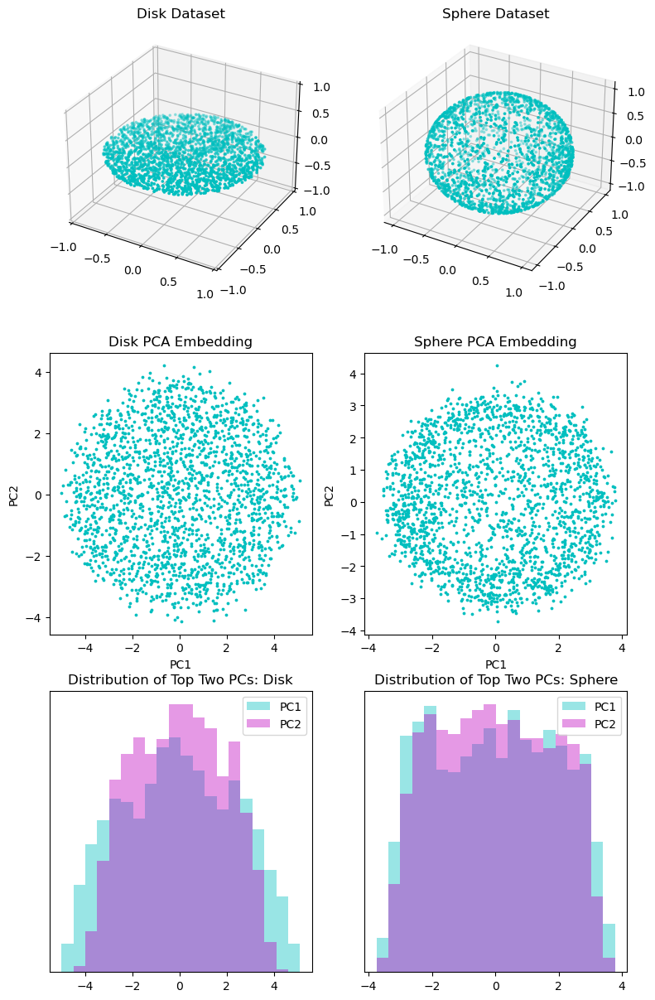

In [5]:
fig = plt.figure(figsize=(9, 15))
tl, tr = fig.add_subplot(321, projection='3d'), fig.add_subplot(322, projection='3d')
ml, mr = fig.add_subplot(323), fig.add_subplot(324)
bl, br = fig.add_subplot(325), fig.add_subplot(326)

tl.set_title('Disk Dataset')
tl.scatter(*disk_dataset_lowd.T, s=3, c='c')
tl.view_init(elev=30)
tl.set_xlim(-1, 1)
tl.set_ylim(-1, 1)
tl.set_zlim(-1, 1)

tr.set_title('Sphere Dataset')
tr.scatter(*sphere_dataset_lowd.T, s=3, c='c')
tr.view_init(elev=30)

ml.set_title('Disk PCA Embedding')
ml.scatter(disk_embed[:, 0], disk_embed[:, 1], s=3, c='c')
ml.set_xlabel('PC1')
ml.set_ylabel('PC2')

mr.set_title('Sphere PCA Embedding')
mr.scatter(sphere_embed[:, 0], sphere_embed[:, 1], s=3, c='c')
mr.set_xlabel('PC1')
mr.set_ylabel('PC2')

bl.set_title('Distribution of Top Two PCs: Disk')
_, bl_bins, _ = bl.hist(disk_embed[:, 0], bins=20, color='c', alpha=0.4, label='PC1')
bl.hist(disk_embed[:, 1], bins=bl_bins, color='m', alpha=0.4, label='PC2')
bl.set_yticks([])
bl.legend()

br.set_title('Distribution of Top Two PCs: Sphere')
_, br_bins, _ = br.hist(sphere_embed[:, 0], bins=20, color='c', alpha=0.4, label='PC1')
br.hist(sphere_embed[:, 1], bins=br_bins, color='m', alpha=0.4, label='PC2')
br.set_yticks([])
br.legend()
# fig.text(0.0, 0.01, 'Figure 2', wrap=True, horizontalalignment='left', fontsize=12)
plt.show()

Furthermore, scatterplots and histograms of the top two principle components, which are most often used for exploratary visualizations like these, yield similar-looking distributions. The spherical data, whose important "structure" was that the data were all similarly distanced from the origin and formed a closed loop, now doesn't look much different from the uniformly sampled disk. Granted, it is impossible to represent the ring-like nature of the sphere in two dimensions. With this in mind, many non-linear methods of dimensionality reduction exist to better capture the structure within such non-linear manifolds. One approach is to generate a new datasets whcih attempts to preserve pairwise distances between datapoints, as in Multidimensional Scaling (MDS).<sup><a href="#references" id="ref2">[2]</a></sup> One formulation, Metric MDS, minimizes the following objective: $\Sigma_{i=2}^{N}\Sigma_{j=1}^{i}(d_{ij}^2-(d_{ij}^*)^2)$, where $d_{ij}$ is the dissimilarity between points $i$ and $j$ in the original dataset and $d_{ij}^*$ is the distance between the two points in the low-dimensional reconstruction. While the measure of dissimilarity can be any non-negative, symmetric function which assigns a dissimilarity of 0 between a point and itself, this blog will use the Euclidean distance metric.

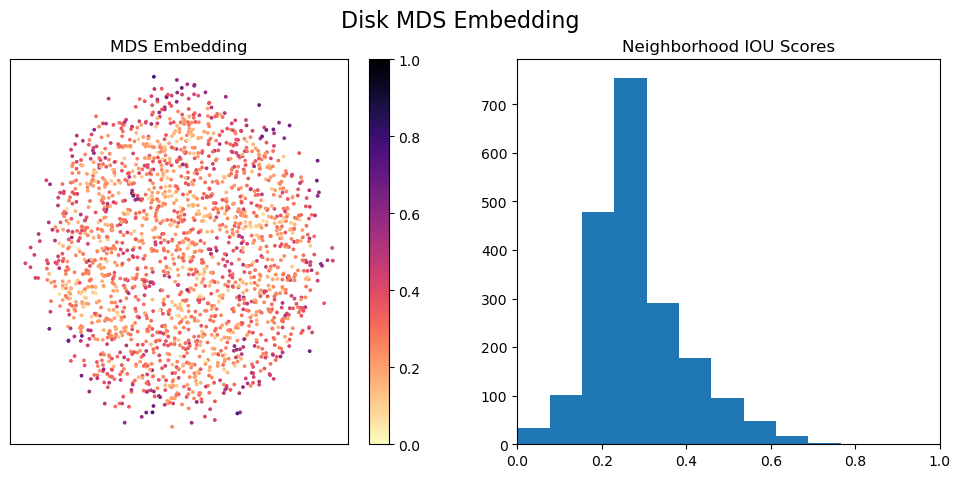

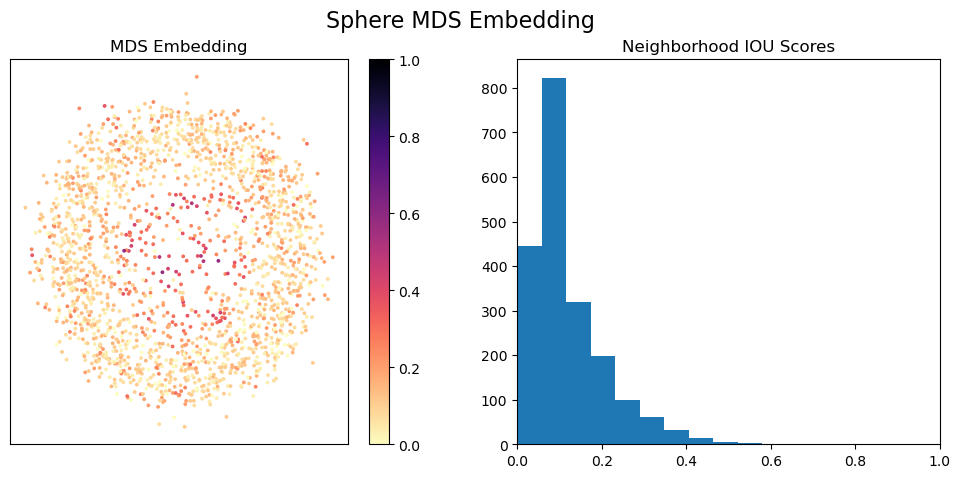

In [6]:
disk_mds = make_mds_embedding(disk_dataset)
sphere_mds = make_mds_embedding(sphere_dataset)

helper_plot_err(disk_dataset, disk_mds, 'MDS', 'Disk MDS Embedding', None)
helper_plot_err(sphere_dataset, sphere_mds, 'MDS', 'Sphere MDS Embedding', None)

While MDS does a better job of showing that in the disk the points are evenly distributed and that in the sphere they tend to be more or less equidistant from the origin. Despite that, the nearest neighbor recall, a measure of how well the embedding places points in the same neighborhood as their nearest neighbors in the high-dimensional dataset, is consistently bad, mostly due to the high-dimensional noise. In the noiseless case, the disk is perfectly reproduced whereas the sphere is reproduced with several low-error points surrounded by a ring of high-error points:

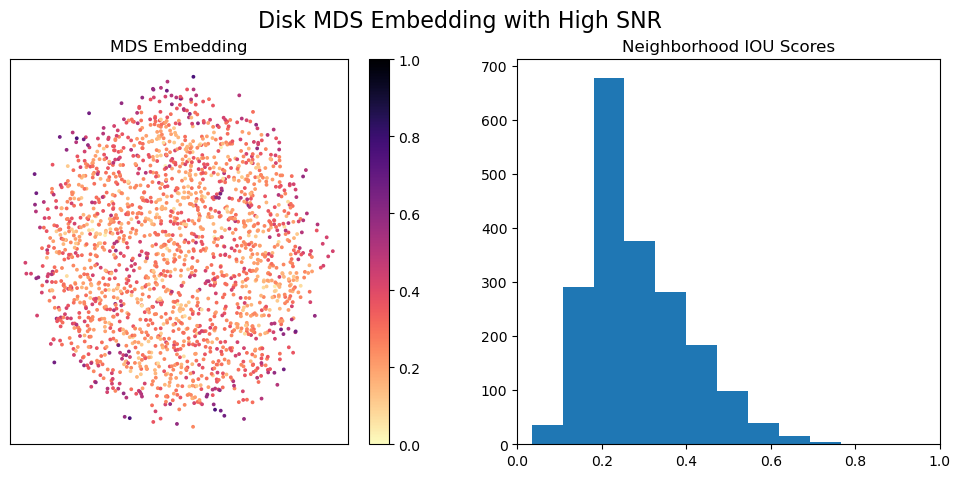

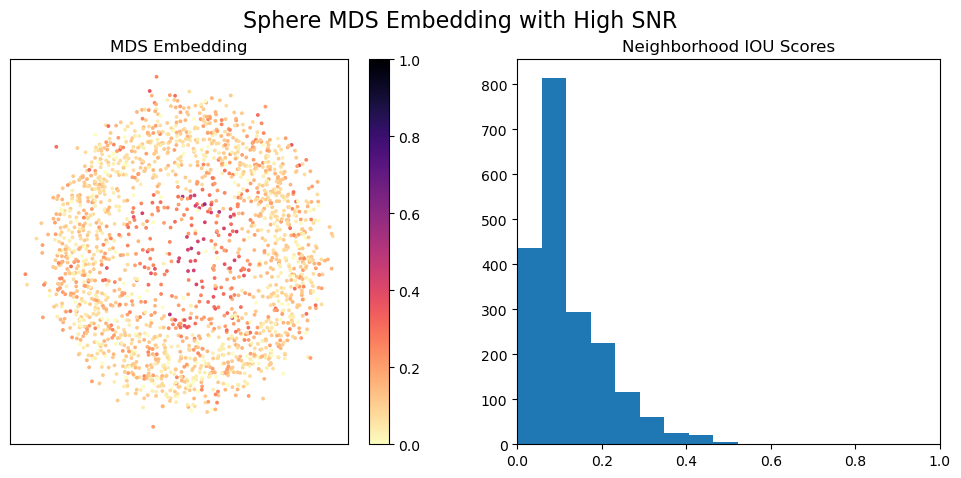

In [7]:
disk_dataset_low_noise = embed_in_high_dim(disk_dataset_lowd, 10)
sphere_dataset_low_noise = embed_in_high_dim(sphere_dataset_lowd, 10)

# Add high-dimensional noise at an SNR of 40dB
# Not going completely noiseless because perfect reconstructions break my error histogram
disk_dataset_low_noise = add_noise_like(disk_dataset, 40)
sphere_dataset_low_noise = add_noise_like(sphere_dataset, 40)

disk_low_noise_mds = make_mds_embedding(disk_dataset_low_noise)
sphere_low_noise_mds = make_mds_embedding(sphere_dataset_low_noise)

helper_plot_err(disk_dataset, disk_low_noise_mds, 'MDS', 'Disk MDS Embedding with High SNR', None)
helper_plot_err(sphere_dataset, sphere_low_noise_mds, 'MDS', 'Sphere MDS Embedding with High SNR', None)

Even in the presence of high-dimensional noise, we can do better in nearest neighbor recall by modifying our objective to focus on locally accurate reconstructions. Enter t-SNE. t-SNE's algorithm consists of three steps:
1) Define the following conditional probability distribution over the original dataset: $p_{j|i}\frac{\exp(-\lVert x_i - x_j\rVert ^2/2\sigma_i^2)}{\Sigma_{k\neq i} \exp(-\lVert x_i - x_k\rVert ^2/2\sigma_i^2)}$, $p_{i|i}=0$. Look similar? It's essentially centering a Gaussian distribution at point $i$ and using the resulting probabilities to determine the probability of point $j$ being a neighbor of point $i$ (with a goal of soft clustering). This can be symmetrized by computing the joint distribution as $p_{ij}=\frac{p_{i|j}+p_{j|i}}{2N}$ which acts as a similarity score between points $i$ and $j$.
2) Similarly, define a similarity score between points in the lower dimensional map as $q_{ij}=\frac{(1+\lVert y_i - y_j\rVert^2)^{-1}}{\Sigma_{k\neq l}(1+\lVert y_k - y_l\rVert^2)^{-1}}$. This time, based on Student's t-distribution instead of the Gaussian distribution.
3) Optimize over $y$ to minimize the KL divergence between the distributions $P$ and $Q$: $\text{Cost} = KL(P||Q)= \Sigma_i\Sigma_j p_{ij}\log\frac{p_{ij}}{q_{ij}}$.<sup><a href="#references" id="ref3">[3]</a></sup>

Note that there are two important parameters: $\sigma$, the bandwidth of $P$, and the learning rate, as this algorithm uses gradient-based optimization. In practice we don't specify values of $\sigma$ directly, but instead specify the desired perplexity, a quantity related to the entropy of $P$ and, correspondingly, the number of nearest neighbors considered by each data point. In practice, the learning rate has a much smaller impact on the resulting embedding and can typically be left at your library's default setting.

With this algorithm, we get great reconstructions locally, but in the process we are forced to dissect the sphere into segments whose edges have poor recall:

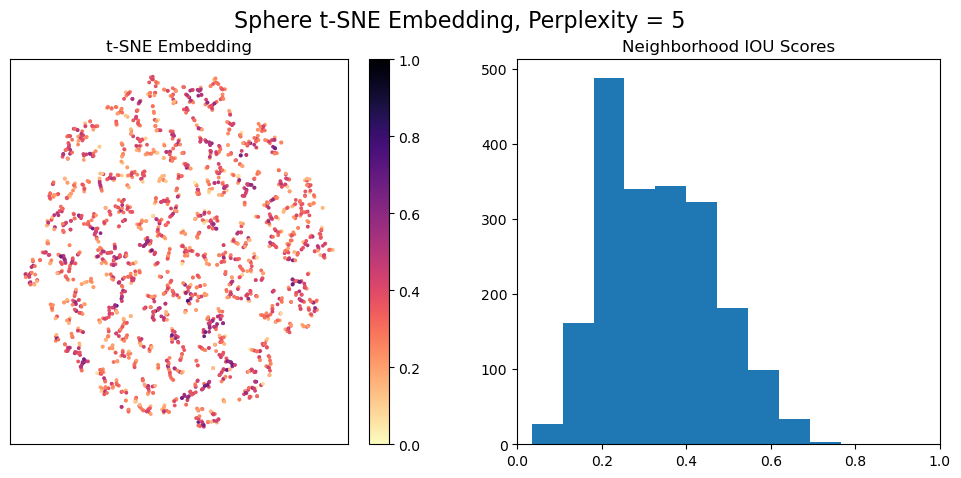

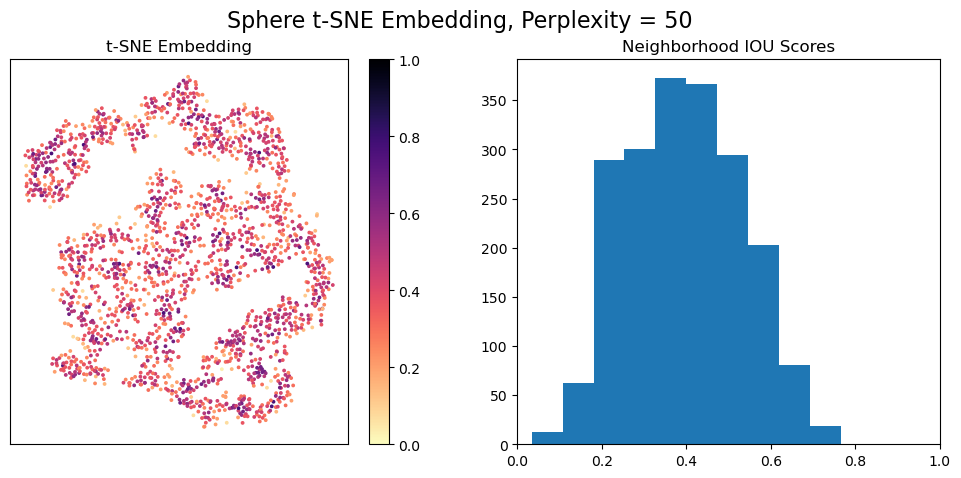

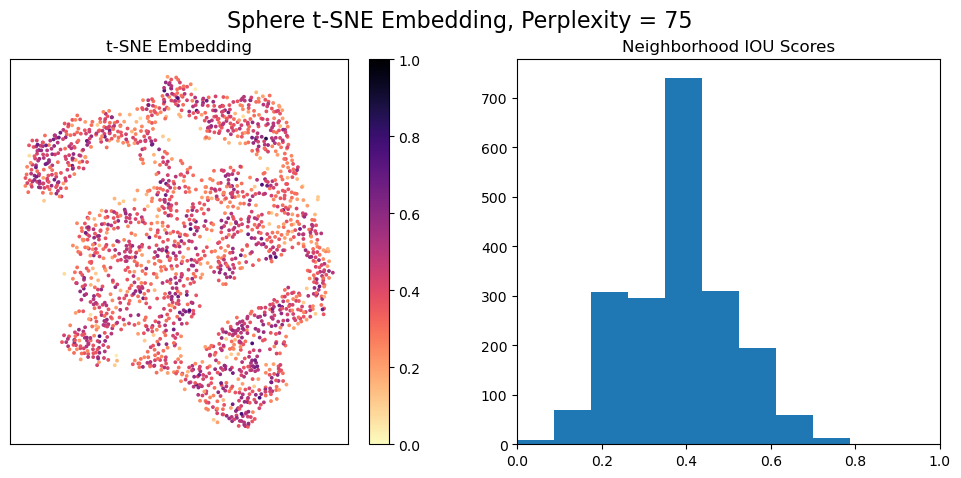

In [8]:
sphere_tsne_lowplex = make_tsne_embedding(sphere_dataset, perplexity=5.0)
sphere_tsne_midplex = make_tsne_embedding(sphere_dataset, perplexity=50.0)
sphere_tsne_highplex = make_tsne_embedding(sphere_dataset, perplexity=75.0)
helper_plot_err(sphere_dataset, sphere_tsne_lowplex, 't-SNE', 'Sphere t-SNE Embedding, Perplexity = 5', None)
helper_plot_err(sphere_dataset, sphere_tsne_midplex, 't-SNE', 'Sphere t-SNE Embedding, Perplexity = 50', None)
helper_plot_err(sphere_dataset, sphere_tsne_highplex, 't-SNE', 'Sphere t-SNE Embedding, Perplexity = 75', None)

Despite the original spherical manifold being sampled uniformly across its surface, t-SNE strongly prefers to create disconnected clusters whose size depends heavily upon perplexity. That being said, within these clusters, neighborhoods of points are very well conserved, as indicated by the high recall scores. This behavior becomes more extreme when the dimensionality of the manifold is higher than that of the visualization, for instance, in a hypercube or hypersphere:

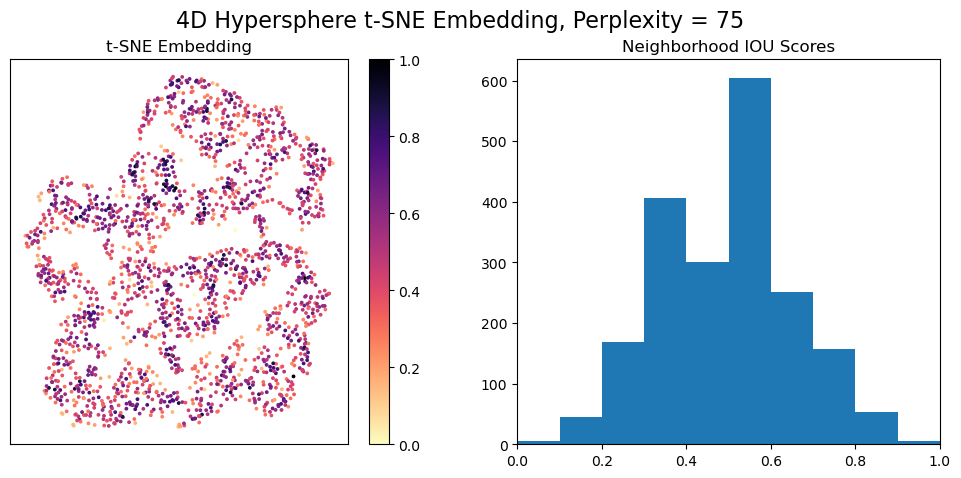

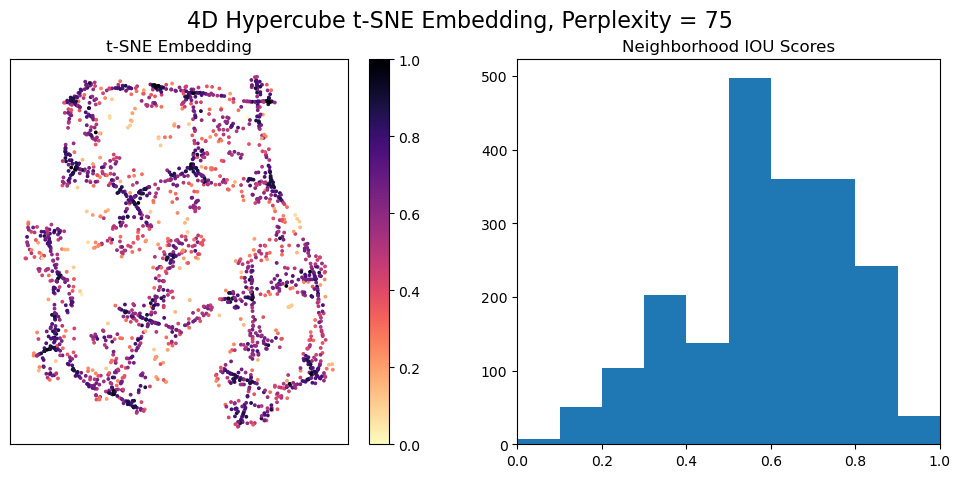

In [9]:
hypersphere_dataset = sample_sphere(num_points=2000, manifold_dim=4)
hypercube_dataset = sample_cube(num_points=2000, manifold_dim=4)

hypersphere_dataset = embed_in_high_dim(hypersphere_dataset, 10)
hypercube_dataset = embed_in_high_dim(hypercube_dataset, 10)

hypersphere_tsne = make_tsne_embedding(hypersphere_dataset, perplexity=75.0)
hypercube_tsne = make_tsne_embedding(hypercube_dataset, perplexity=75.0)

helper_plot_err(hypersphere_dataset, hypersphere_tsne, 't-SNE', '4D Hypersphere t-SNE Embedding, Perplexity = 75', None)
helper_plot_err(hypercube_dataset, hypercube_tsne, 't-SNE', '4D Hypercube t-SNE Embedding, Perplexity = 75', None)

We can also observe how UMAP, a similar dimensionality reduction algorithm which operates on the assumption that the manifold is sampled uniformly, perfroms over several choices of the most critical *n_neighbors* parameter:

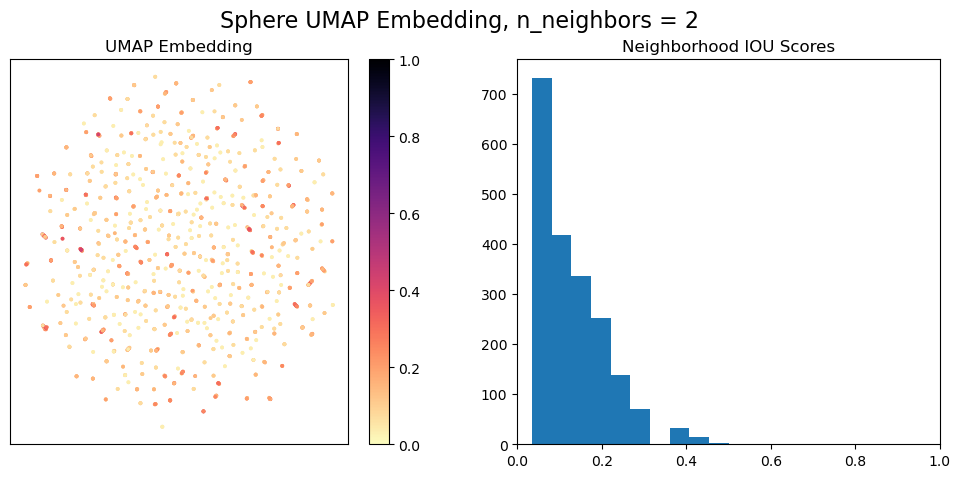

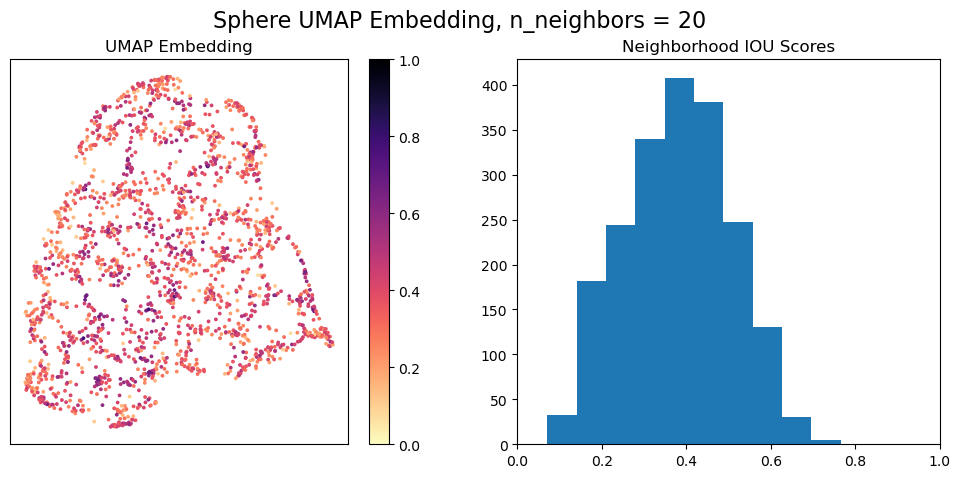

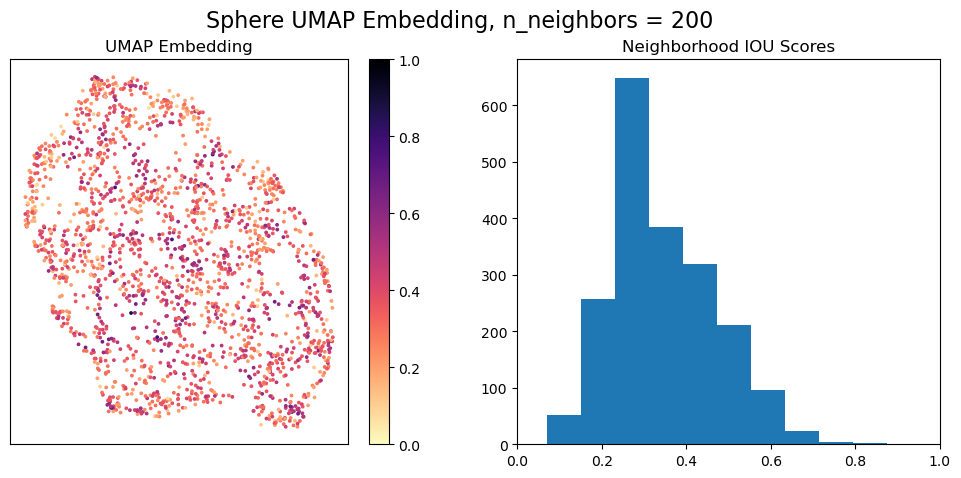

In [10]:
sphere_umap_2 = make_umap_embedding(sphere_dataset, n_neighbors=2)
sphere_umap_20 = make_umap_embedding(sphere_dataset, n_neighbors=20)
sphere_umap_200 = make_umap_embedding(sphere_dataset, n_neighbors=200)

helper_plot_err(sphere_dataset, sphere_umap_2, 'UMAP', 'Sphere UMAP Embedding, n_neighbors = 2', None)
helper_plot_err(sphere_dataset, sphere_umap_20, 'UMAP', 'Sphere UMAP Embedding, n_neighbors = 20', None)
helper_plot_err(sphere_dataset, sphere_umap_200, 'UMAP', 'Sphere UMAP Embedding, n_neighbors = 200', None)

While it's been fun talking about spheres, at the end of the day they represent a class of nonlinear manifolds that we know cannot be perfectly visualized in two dimensions. So, let's try something new:

### Cloth manifolds

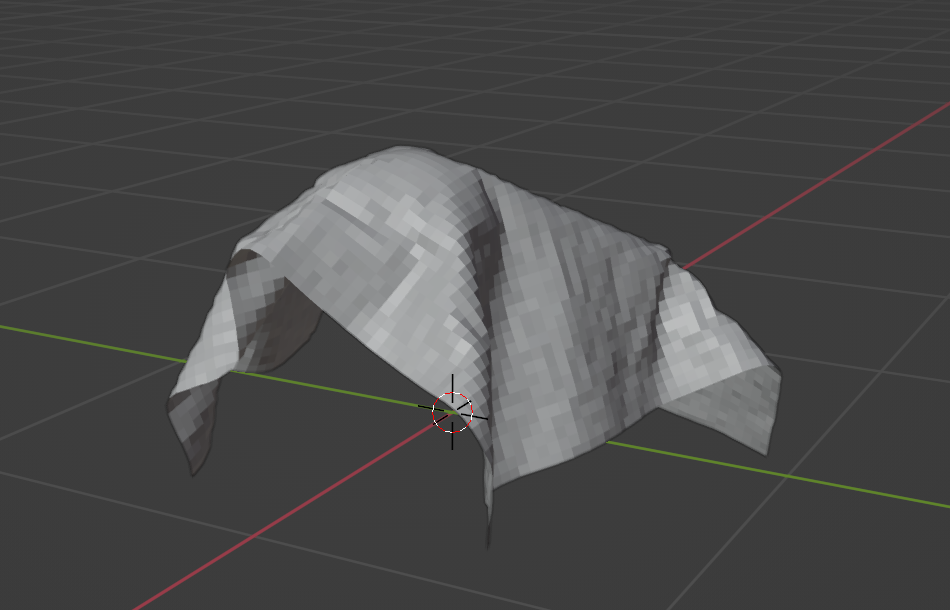

Here, we have a 2d planar cloth, which has been dropped over some simple objects to impose a non-linear transformation on the plane. In this setup, we can sample from the cloth's surface with arbitrary PMFs by mapping points from the unit square via information about the object's vertices.

So this:

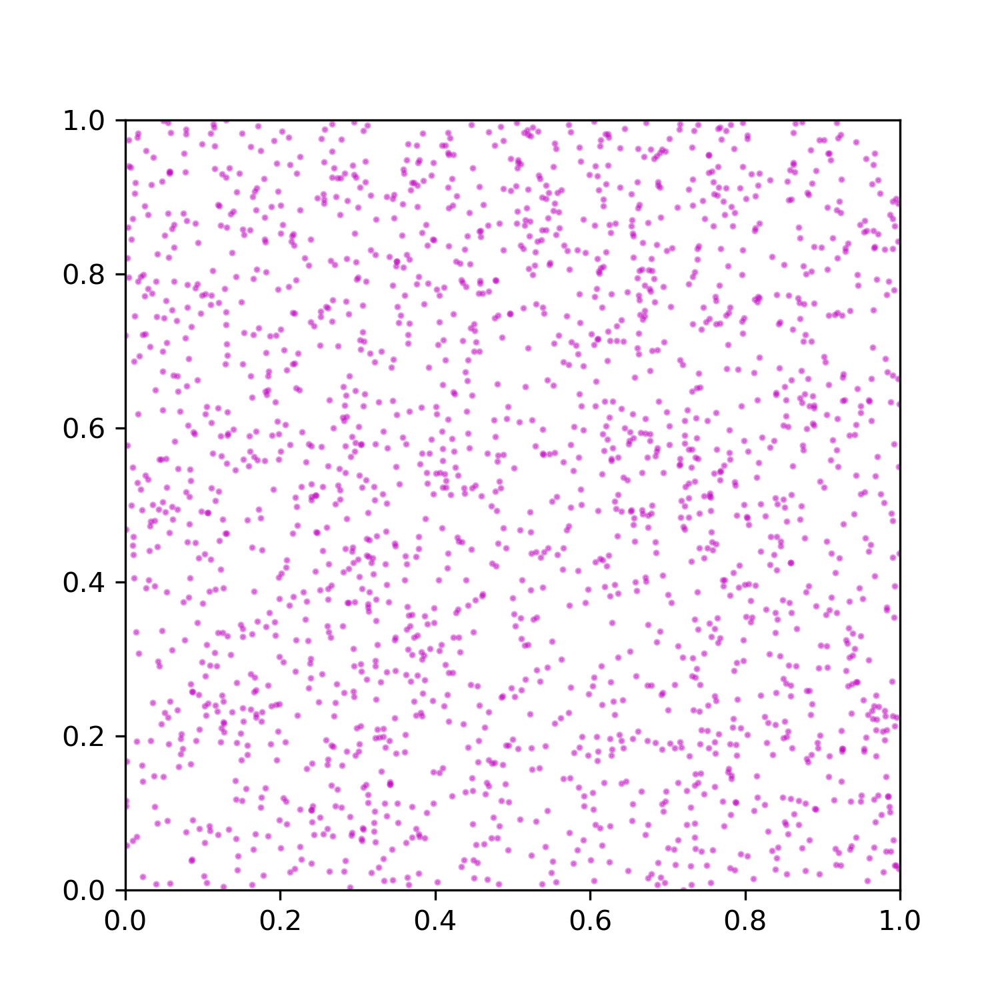

In [11]:
Image(filename='cloth_images/uniform_density.png', width=400, height=400)

can become this:

In [12]:
Video(filename="cloth_images/cloth_uniform_sample.mp4", html_attributes='loop autoplay', width=800, height=800)

And this:

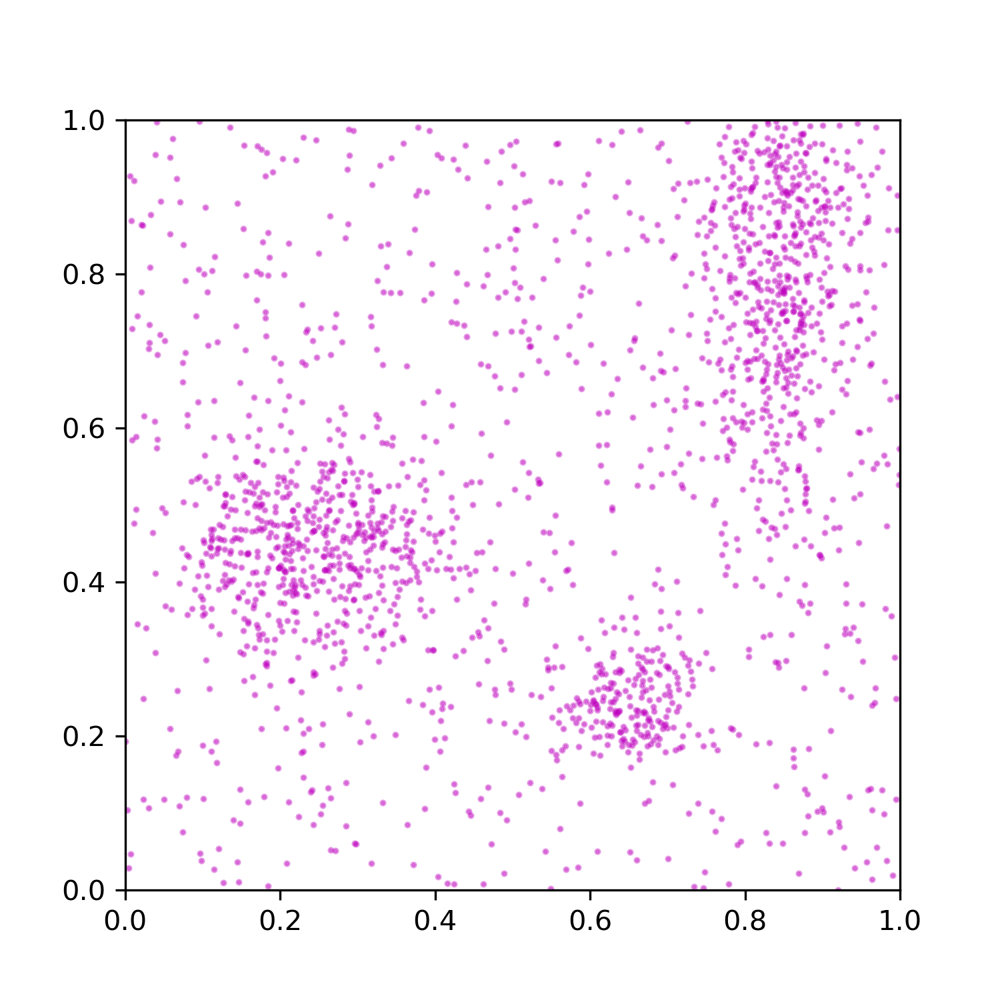

In [13]:
Image(filename='cloth_images/nonuniform_density.png', width=400, height=400)

Can become this:

In [14]:
Video(filename="cloth_images/cloth_nonuniform_sample.mp4", html_attributes='loop autoplay', width=800, height=800)

Ideally, our dimensionality reduction procedure should be able to recover a square, which corresponds to the original parametrization of the manifold. In the ideal condition of noise-free observations of a noise-free manifold, when the manifold is uniformly sampled (N=1993) we can usually recover something similar to a square:

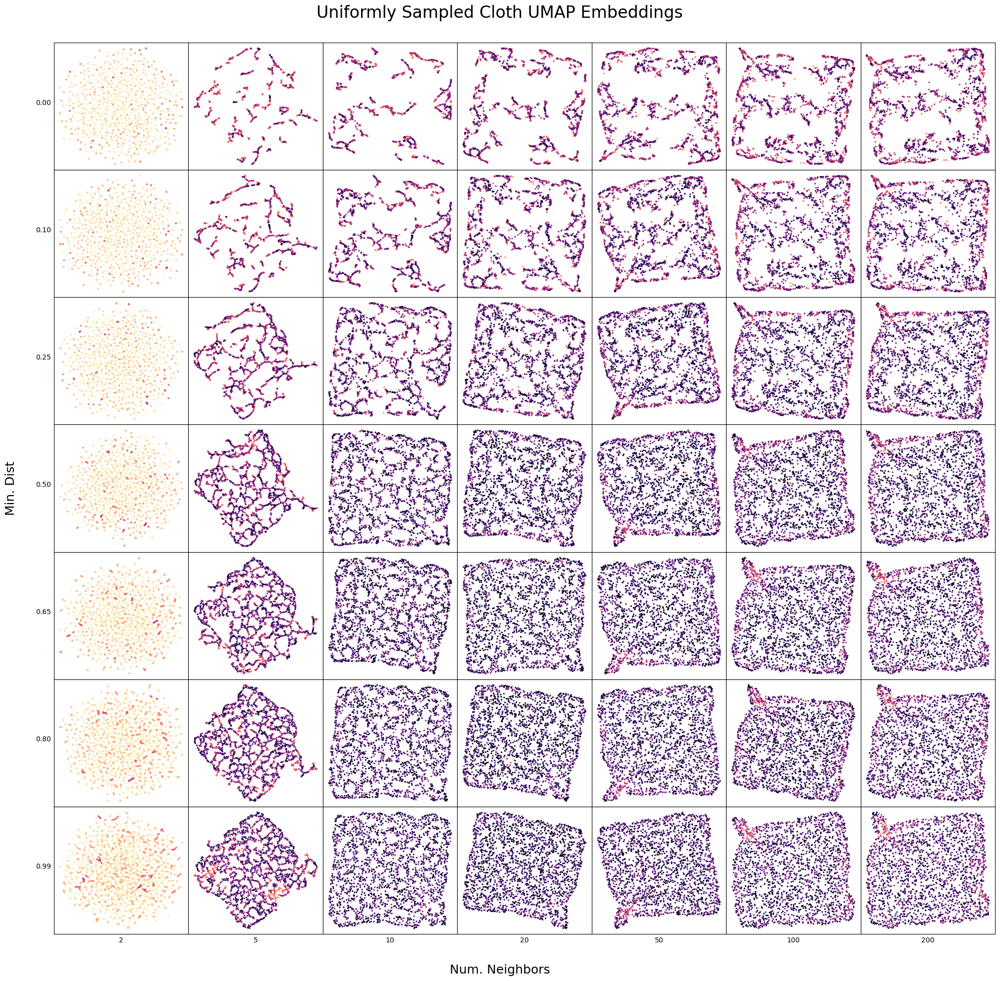

In [15]:
num_neighbors_sweep = (2, 5, 10, 20, 50, 100, 200)
min_dist_sweep = (0.0, 0.1, 0.25, 0.5, 0.65, 0.8, 0.99)
get_fname = lambda n,d: f'uniform_cloth_umaps/{n}_{d:.2f}.npy'

uniform_samples = np.load('cloth_images/uniform_sample.npy')
num_nn = 15

fig = plt.figure(figsize=(20, 20))
gs = fig.add_gridspec(7, 7, wspace=0, hspace=0, left=0.05, bottom=0.05, top=0.95, right=1)

# fake axis labels and title
fig.text(0.5, 0.975, 'Uniformly Sampled Cloth UMAP Embeddings', horizontalalignment='center', fontsize=24)
fig.text(0.5, 0.01, 'Num. Neighbors', wrap=True, horizontalalignment='center', fontsize=18)
fig.text(0.01, 0.5, 'Min. Dist', wrap=True, horizontalalignment='center', fontsize=18, rotation=90)

for i, min_dist in enumerate(min_dist_sweep):
    for j, num_neighbors in enumerate(num_neighbors_sweep):
        # num neighbors along x axis, min dist along y axis
        # ax = fig.add_subplot(7, 7, i*7+j+1)
        ax = fig.add_subplot(gs[i,j])
        data = np.load(get_fname(num_neighbors, min_dist))
        errs = iou_distance(uniform_samples, data, num_nn=num_nn)
        scatter = ax.scatter(data[:, 0], data[:, 1], c=errs, cmap='magma_r', s=2)
        scatter.set_clim(0, 1)
        ax.set_xticks([])
        ax.set_yticks([])
        if i == len(min_dist_sweep) - 1:
            ax.set_xlabel(f'{num_neighbors}')  # label j
        if j == 0:
            ax.set_ylabel(f'{min_dist:.2f}', rotation=0, horizontalalignment='right')  # label i
        ax.label_outer()
plt.show()

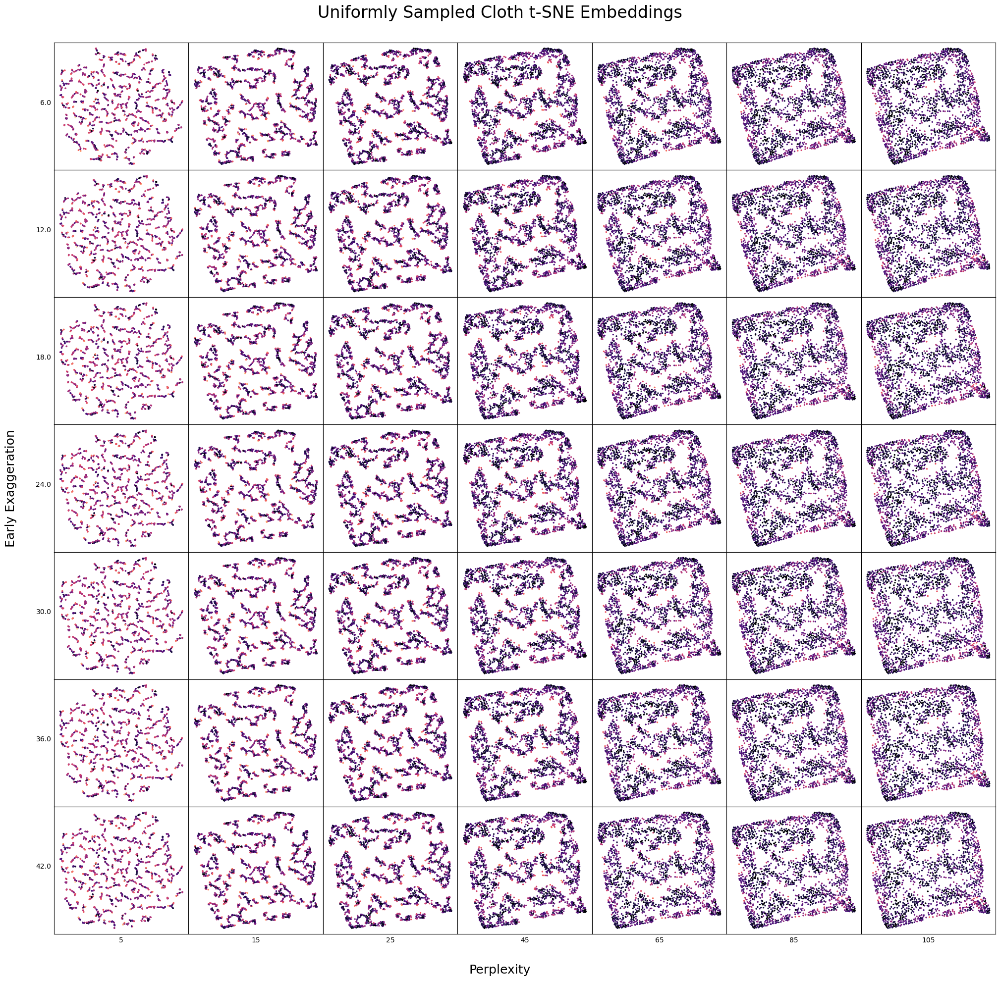

In [16]:
perplexity_sweep = (5, 15, 25, 45, 65, 85, 105)
early_exagg_sweep = np.linspace(6, 42, 7, endpoint=True)
get_fname = lambda p,ee: f'uniform_cloth_tsnes/{p}_{ee:.1f}.npy'

uniform_samples = np.load('cloth_images/uniform_sample.npy')
num_nn = 15

fig = plt.figure(figsize=(20, 20))
gs = fig.add_gridspec(7, 7, wspace=0, hspace=0, left=0.05, bottom=0.05, top=0.95, right=1)

# fake axis labels and title
fig.text(0.5, 0.975, 'Uniformly Sampled Cloth t-SNE Embeddings', horizontalalignment='center', fontsize=24)
fig.text(0.5, 0.01, 'Perplexity', wrap=True, horizontalalignment='center', fontsize=18)
fig.text(0.01, 0.5, 'Early Exaggeration', wrap=True, horizontalalignment='center', fontsize=18, rotation=90)

for i, early_exagg in enumerate(early_exagg_sweep):
    for j, perplexity in enumerate(perplexity_sweep):
        # num neighbors along x axis, min dist along y axis
        # ax = fig.add_subplot(7, 7, i*7+j+1)
        ax = fig.add_subplot(gs[i,j])
        data = np.load(get_fname(perplexity, early_exagg))
        errs = iou_distance(uniform_samples, data, num_nn=num_nn)
        scatter = ax.scatter(data[:, 0], data[:, 1], c=errs, cmap='magma_r', s=2)
        scatter.set_clim(0, 1)
        ax.set_xticks([])
        ax.set_yticks([])
        if i == len(early_exagg_sweep) - 1:
            ax.set_xlabel(f'{perplexity}')  # label j
        if j == 0:
            ax.set_ylabel(f'{early_exagg:.1f}', rotation=0, horizontalalignment='right')  # label i
        ax.label_outer()
plt.show()

And in the (still noiseless) scenario where the manifold is non-uniformly sampled, we can typically recover the regions of high density reliably while failing to acknowledge most of the lower density region in between:

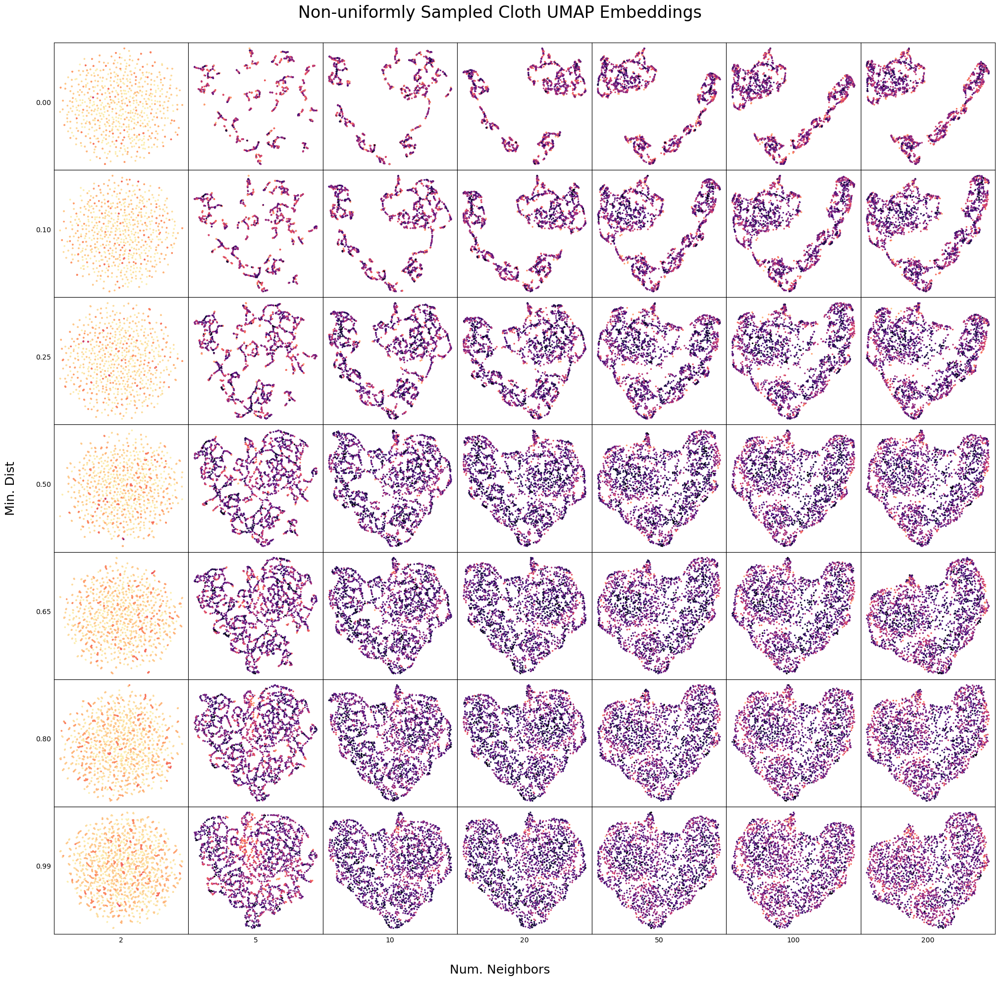

In [17]:
num_neighbors_sweep = (2, 5, 10, 20, 50, 100, 200)
min_dist_sweep = (0.0, 0.1, 0.25, 0.5, 0.65, 0.8, 0.99)
get_fname = lambda n,d: f'nonuniform_cloth_umaps/{n}_{d:.2f}.npy'

nonuniform_samples = np.load('cloth_images/nonuniform_sample.npy')
num_nn = 15

fig = plt.figure(figsize=(20, 20))
gs = fig.add_gridspec(7, 7, wspace=0, hspace=0, left=0.05, bottom=0.05, top=0.95, right=1)

# fake axis labels and title
fig.text(0.5, 0.975, 'Non-uniformly Sampled Cloth UMAP Embeddings', horizontalalignment='center', fontsize=24)
fig.text(0.5, 0.01, 'Num. Neighbors', wrap=True, horizontalalignment='center', fontsize=18)
fig.text(0.01, 0.5, 'Min. Dist', wrap=True, horizontalalignment='center', fontsize=18, rotation=90)

for i, min_dist in enumerate(min_dist_sweep):
    for j, num_neighbors in enumerate(num_neighbors_sweep):
        # num neighbors along x axis, min dist along y axis
        # ax = fig.add_subplot(7, 7, i*7+j+1)
        ax = fig.add_subplot(gs[i,j])
        data = np.load(get_fname(num_neighbors, min_dist))
        errs = iou_distance(nonuniform_samples, data, num_nn=num_nn)
        scatter = ax.scatter(data[:, 0], data[:, 1], c=errs, cmap='magma_r', s=2)
        scatter.set_clim(0, 1)
        ax.set_xticks([])
        ax.set_yticks([])
        if i == len(min_dist_sweep) - 1:
            ax.set_xlabel(f'{num_neighbors}')  # label j
        if j == 0:
            ax.set_ylabel(f'{min_dist:.2f}', rotation=0, horizontalalignment='right')  # label i
        ax.label_outer()
plt.show()

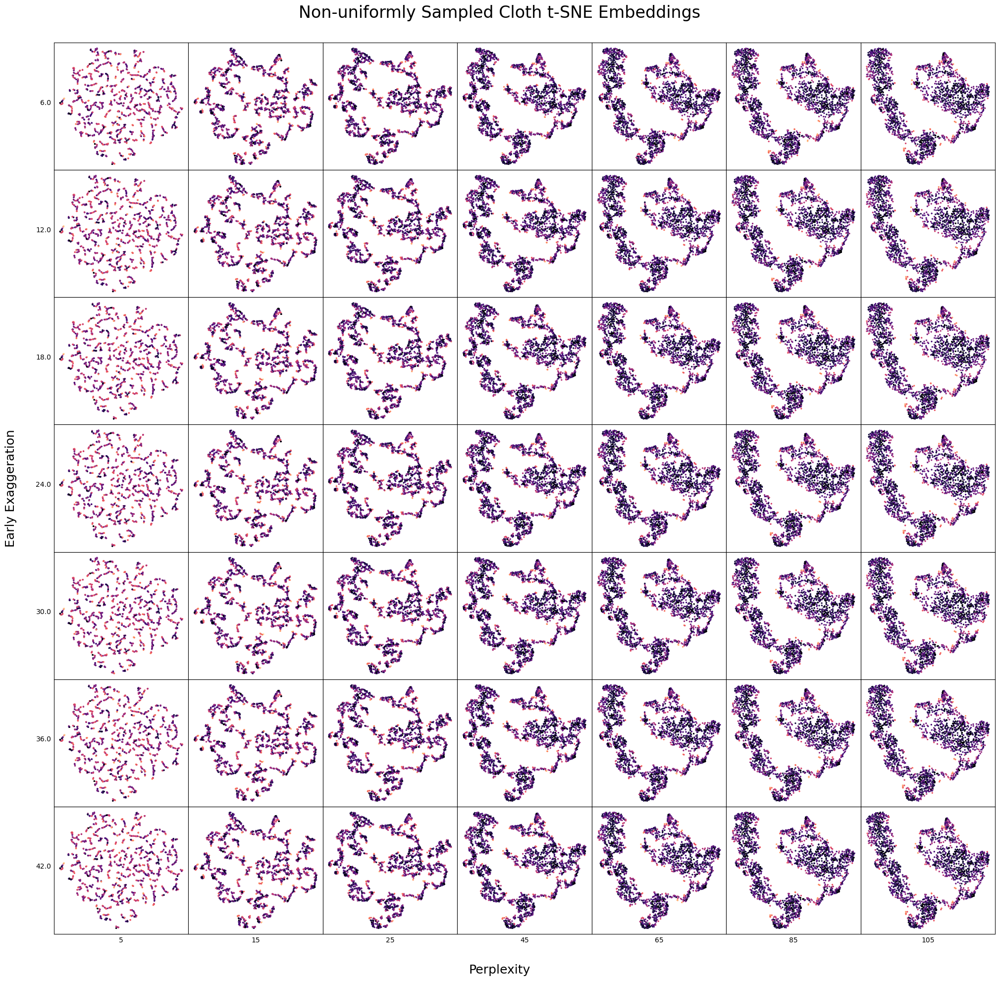

In [18]:
perplexity_sweep = (5, 15, 25, 45, 65, 85, 105)
early_exagg_sweep = np.linspace(6, 42, 7, endpoint=True)
get_fname = lambda p,ee: f'nonuniform_cloth_tsnes/{p}_{ee:.1f}.npy'

nonuniform_samples = np.load('cloth_images/nonuniform_sample.npy')
num_nn = 15

fig = plt.figure(figsize=(20, 20))
gs = fig.add_gridspec(7, 7, wspace=0, hspace=0, left=0.05, bottom=0.05, top=0.95, right=1)

# fake axis labels and title
fig.text(0.5, 0.975, 'Non-uniformly Sampled Cloth t-SNE Embeddings', horizontalalignment='center', fontsize=24)
fig.text(0.5, 0.01, 'Perplexity', wrap=True, horizontalalignment='center', fontsize=18)
fig.text(0.01, 0.5, 'Early Exaggeration', wrap=True, horizontalalignment='center', fontsize=18, rotation=90)

for i, early_exagg in enumerate(early_exagg_sweep):
    for j, perplexity in enumerate(perplexity_sweep):
        # num neighbors along x axis, min dist along y axis
        # ax = fig.add_subplot(7, 7, i*7+j+1)
        ax = fig.add_subplot(gs[i,j])
        data = np.load(get_fname(perplexity, early_exagg))
        errs = iou_distance(nonuniform_samples, data, num_nn=num_nn)
        scatter = ax.scatter(data[:, 0], data[:, 1], c=errs, cmap='magma_r', s=2)
        scatter.set_clim(0, 1)
        ax.set_xticks([])
        ax.set_yticks([])
        if i == len(early_exagg_sweep) - 1:
            ax.set_xlabel(f'{perplexity}')  # label j
        if j == 0:
            ax.set_ylabel(f'{early_exagg:.1f}', rotation=0, horizontalalignment='right')  # label i
        ax.label_outer()
plt.show()

### References:
<div id="references"/>

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<a href="#ref1">1)</a>  Stevenson, I., Kording, K. How advances in neural recording affect data analysis. Nat Neurosci 14, 139–142 (2011). https://doi.org/10.1038/nn.2731

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<a href="#ref2">2)</a>  Mead, A. (1992). Review of the Development of Multidimensional Scaling Methods. Journal of the Royal Statistical Society. Series D (The Statistician), 41(1), 27–39. https://doi.org/10.2307/2348634

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<a href="#ref3">3)</a>  van der Maaten, L. & Hinton, G. (2008). Visualizing Data using t-SNE . Journal of Machine Learning Research, 9, 2579--2605.